In [ ]:
import pandas as pd
import numpy as np
import os
import torch
import torchvision
from torch.utils.data import DataLoader
from torchvision import transforms
from torch.utils.data import Dataset,SubsetRandomSampler,SequentialSampler,Sampler
import matplotlib.pyplot as plt
from torch import nn
import torch.nn.functional as F
import torchvision.models as models
from torch import optim
from torchvision.datasets import ImageFolder
from tqdm.notebook import tqdm
import torch.backends.cudnn as cudnn
import glob
from skimage import io, transform
from PIL import Image
import random
import PIL.ImageEnhance as ie
import copy
from torch.autograd import Variable
from math import floor
from google.colab import files,drive

%matplotlib inline 

In [ ]:
# Check if the GPU is available

gpu = torch.cuda.is_available()

if gpu:
    print("CUDA is available. Training on GPU")
else:
    print("CUDA unavailable. Training on CPU")

CUDA is available. Training on GPU


Loading the Images form MIT source http://groups.csail.mit.edu/vision/LabelMe/NewImages/indoorCVPR_09.tar

In [ ]:
!wget http://groups.csail.mit.edu/vision/LabelMe/NewImages/indoorCVPR_09.tar

--2023-04-17 03:54:21--  http://groups.csail.mit.edu/vision/LabelMe/NewImages/indoorCVPR_09.tar
Resolving groups.csail.mit.edu (groups.csail.mit.edu)... 128.30.2.44
Connecting to groups.csail.mit.edu (groups.csail.mit.edu)|128.30.2.44|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2592010240 (2.4G) [application/x-tar]
Saving to: ‘indoorCVPR_09.tar’

indoorCVPR_09.tar   100%[===================>]   2.41G  11.6MB/s    in 3m 35s  

2023-04-17 03:57:58 (11.5 MB/s) - ‘indoorCVPR_09.tar’ saved [2592010240/2592010240]



Remove Images folder and it's content if any

In [ ]:
# !rm -r Images

Unzip the images from above downloaded tar file

In [ ]:
!tar -xvf indoorCVPR_09.tar

Streaming output truncated to the last 5000 lines.
Images/mall/cover_home3.jpg
Images/mall/CP67791.jpg
Images/mall/crocker_galleria_735089.jpg
Images/mall/mall1.jpg
Images/mall/d8.jpg
Images/mall/deira_city_centre_dubai_08.jpg
Images/mall/dungarv_new_mall.jpg
Images/mall/latham_circle_mall_16.jpg
Images/mall/eastridg1.jpg
Images/mall/IMG_6449.jpg
Images/mall/main_boutique_b.jpg
Images/mall/easyfranchise_centre_commercial_1.jpg
Images/mall/ins42.jpg
Images/mall/mall14.jpg
Images/mall/eaton_centre_2001_03.jpg
Images/mall/ins43.jpg
Images/mall/mall17.jpg
Images/mall/full_shopping_Central_1.jpg
Images/mall/galleria.jpg
Images/mall/galleria1.jpg
Images/mall/galleria2.jpg
Images/mall/Galleria_003.jpg
Images/mall/laurel_mall_06.jpg
Images/mall/Galleria_1.jpg
Images/mall/galleria_san_federico_nr_109_2_n1.jpg
Images/mall/ins23.jpg
Images/mall/ins44.jpg
Images/mall/mall18.jpg
Images/mall/galleria_vittorio_emanuele_ii_milan_mlgalar.jpg
Images/mall/ins45.jpg
Images/mall/mall19.jpg
Images/mall/GUM_

In [ ]:
!mkdir Source_Images
!tar -xvf indoorCVPR_09.tar --directory Source_Images


Streaming output truncated to the last 5000 lines.
Images/mall/cover_home3.jpg
Images/mall/CP67791.jpg
Images/mall/crocker_galleria_735089.jpg
Images/mall/mall1.jpg
Images/mall/d8.jpg
Images/mall/deira_city_centre_dubai_08.jpg
Images/mall/dungarv_new_mall.jpg
Images/mall/latham_circle_mall_16.jpg
Images/mall/eastridg1.jpg
Images/mall/IMG_6449.jpg
Images/mall/main_boutique_b.jpg
Images/mall/easyfranchise_centre_commercial_1.jpg
Images/mall/ins42.jpg
Images/mall/mall14.jpg
Images/mall/eaton_centre_2001_03.jpg
Images/mall/ins43.jpg
Images/mall/mall17.jpg
Images/mall/full_shopping_Central_1.jpg
Images/mall/galleria.jpg
Images/mall/galleria1.jpg
Images/mall/galleria2.jpg
Images/mall/Galleria_003.jpg
Images/mall/laurel_mall_06.jpg
Images/mall/Galleria_1.jpg
Images/mall/galleria_san_federico_nr_109_2_n1.jpg
Images/mall/ins23.jpg
Images/mall/ins44.jpg
Images/mall/mall18.jpg
Images/mall/galleria_vittorio_emanuele_ii_milan_mlgalar.jpg
Images/mall/ins45.jpg
Images/mall/mall19.jpg
Images/mall/GUM_

Images Category folders

In [ ]:
!ls Images

airport_inside	computerroom	     inside_subway   pantry
artstudio	concert_hall	     jewelleryshop   poolinside
auditorium	corridor	     kindergarden    prisoncell
bakery		deli		     kitchen	     restaurant
bar		dentaloffice	     laboratorywet   restaurant_kitchen
bathroom	dining_room	     laundromat      shoeshop
bedroom		elevator	     library	     stairscase
bookstore	fastfood_restaurant  livingroom      studiomusic
bowling		florist		     lobby	     subway
buffet		gameroom	     locker_room     toystore
casino		garage		     mall	     trainstation
children_room	greenhouse	     meeting_room    tv_studio
church_inside	grocerystore	     movietheater    videostore
classroom	gym		     museum	     waitingroom
cloister	hairsalon	     nursery	     warehouse
closet		hospitalroom	     office	     winecellar
clothingstore	inside_bus	     operating_room


In [ ]:
!ls Source_Images/Images

airport_inside	computerroom	     inside_subway   pantry
artstudio	concert_hall	     jewelleryshop   poolinside
auditorium	corridor	     kindergarden    prisoncell
bakery		deli		     kitchen	     restaurant
bar		dentaloffice	     laboratorywet   restaurant_kitchen
bathroom	dining_room	     laundromat      shoeshop
bedroom		elevator	     library	     stairscase
bookstore	fastfood_restaurant  livingroom      studiomusic
bowling		florist		     lobby	     subway
buffet		gameroom	     locker_room     toystore
casino		garage		     mall	     trainstation
children_room	greenhouse	     meeting_room    tv_studio
church_inside	grocerystore	     movietheater    videostore
classroom	gym		     museum	     waitingroom
cloister	hairsalon	     nursery	     warehouse
closet		hospitalroom	     office	     winecellar
clothingstore	inside_bus	     operating_room


In [ ]:
# !cp -a Images/. Source_Images

In [ ]:
parent_folder = 'Images'
categories=os.listdir(parent_folder + '/')
print(categories)

['livingroom', 'artstudio', 'hospitalroom', 'restaurant', 'cloister', 'trainstation', 'florist', 'studiomusic', 'pantry', 'nursery', 'jewelleryshop', 'casino', 'bathroom', 'kindergarden', 'restaurant_kitchen', 'winecellar', 'buffet', 'stairscase', 'bowling', 'garage', 'warehouse', 'kitchen', 'hairsalon', 'locker_room', 'laboratorywet', 'shoeshop', 'bakery', 'toystore', 'meeting_room', 'dentaloffice', 'subway', 'bookstore', 'dining_room', 'tv_studio', 'fastfood_restaurant', 'gym', 'office', 'bar', 'inside_bus', 'corridor', 'bedroom', 'lobby', 'children_room', 'computerroom', 'concert_hall', 'grocerystore', 'church_inside', 'prisoncell', 'operating_room', 'movietheater', 'waitingroom', 'videostore', 'inside_subway', 'mall', 'deli', 'clothingstore', 'gameroom', 'classroom', 'airport_inside', 'greenhouse', 'museum', 'closet', 'elevator', 'auditorium', 'laundromat', 'library', 'poolinside']


All images from specific image category (greenhouse)

In [ ]:
images=os.listdir(os.path.join(os.getcwd(),'Images','church_inside'))
print(images)

['Iguala_Iglesia.jpg', '2166394829.jpg', 'metropolitana_79_07_flickr.jpg', 'QuitoChurch.jpg', 'kirche-innen.jpg', 'underground_55_06_flickr.jpg', 'KaGrou2.jpg', 'oberkirche01.jpg', 'pantry_58_20_flickr.jpg', 'blasii_kirche_nordhausen.jpg', 'metropolitana_97_12_flickr.jpg', 'CH_Horgen_RefKirche.jpg', 'fz7kirche1my5.jpg', 'Kirche_Mittelgang.jpg', 'eglise_st_pierre_1893_full.jpg', 'Kirche_Cyrhla_1068.jpg', 'prty3dfhxo3.jpg', 'innenansicht_kirche.jpg', 'FreeFoto_castle_30_33.jpg', 'metropolitana_09_16_flickr.jpg', 'metropolitana_123_07_flickr.jpg', 'metropolitana_70_14_flickr.jpg', 'klimmach_kirche_innen_von_empore_g.jpg', 'metropolitana_71_22_flickr.jpg', 'hottinger_kirche_neu_innen.jpg', 'metropolitana_69_04_flickr.jpg', 'St_Germain_des_Pr_s_autel.jpg', 'metropolitana_19_23_flickr.jpg', 'UniversityPresbyterian.jpg', 'chiemsee_fraueninsel_kircheP9175239_gross.jpg', 'eglise_hugo.jpg', 'casa_kirche_56tz.jpg', 'methodist_june04_02s.jpg', '243069.jpg', 'P0000231.jpg', 'metropolitana_100_10_fl

Read the all images categories and the images from those catigories folders

In [ ]:
from collections import defaultdict

parent_folder = 'Images'
categories=os.listdir(parent_folder + '/')
# print(categories)
categories.sort()
labeldict={}
count=0

for category in categories:
    labeldict[category]=category
    count+=1
    
class_freq=defaultdict(int)
csvlist=[]

for category in categories:
    images=os.listdir(os.path.join(os.getcwd(),parent_folder,category))
    count=1
    for img in images:
        an=img.split(".")        
        newname=str(category)+"_"+str(count)+"."+str(an[-1])
        os.rename(os.path.join(os.getcwd(),parent_folder,category,img),os.path.join(os.getcwd(),parent_folder,newname))
        csvlist.append([labeldict[category],newname])
        class_freq[category]+=1
        count+=1
        
for category in categories:
    os.rmdir(os.path.join(parent_folder,category))

### Move Train csv file to parent folder
df=pd.DataFrame(csvlist,columns=["Category","Id"])
df.to_csv("Train.csv")

In [ ]:
!ls Images/

Streaming output truncated to the last 5000 lines.
airport_inside_288.jpg	deli_168.jpg		     mall_139.jpg
airport_inside_289.jpg	deli_169.jpg		     mall_13.jpg
airport_inside_28.jpg	deli_16.jpg		     mall_140.jpg
airport_inside_290.jpg	deli_170.jpg		     mall_141.jpg
airport_inside_291.jpg	deli_171.jpg		     mall_142.jpg
airport_inside_292.jpg	deli_172.jpg		     mall_143.jpg
airport_inside_293.jpg	deli_173.jpg		     mall_144.jpg
airport_inside_294.jpg	deli_174.jpg		     mall_145.jpg
airport_inside_295.jpg	deli_175.jpg		     mall_146.jpg
airport_inside_296.jpg	deli_176.jpg		     mall_147.jpg
airport_inside_297.jpg	deli_177.jpg		     mall_148.jpg
airport_inside_298.jpg	deli_178.jpg		     mall_149.jpg
airport_inside_299.jpg	deli_179.jpg		     mall_14.jpg
airport_inside_29.jpg	deli_17.jpg		     mall_150.jpg
airport_inside_2.jpg	deli_180.jpg		     mall_151.jpg
airport_inside_300.jpg	deli_181.jpg		     mall_152.jpg
airport_inside_301.jpg	deli_182.jpg		     mall_153.jpg
airport_inside_302.jpg

Defining a common ImageDataset Class

In [ ]:
class ImageDataset(Dataset): 
    
    def __init__(self, csv_file, root_dir, transform=None):
        self.data_frame = pd.read_csv(csv_file)
        self.root_dir = root_dir
        self.transform = transform

    def __len__(self):
        return len(self.data_frame)

    def __getitem__(self, idx):
        img_name = os.path.join(self.root_dir, self.data_frame['Id'][idx])         
        image = Image.open(img_name).convert('RGB')                               
        label = np.array(self.data_frame['Category'][idx])                        
        if self.transform:            
            image = self.transform(image)                                         
        sample = (image, label)        
        return sample

Data Augmentation using various methods , source : https://github.com/mratsim/Amazon-Forest-Computer-Vision/blob/master/src/p_data_augmentation.py

In [ ]:
class Lighting(object):
    """Lighting noise(AlexNet - style PCA - based noise)"""

    def __init__(self, alphastd, eigval, eigvec):
        self.alphastd = alphastd
        self.eigval = eigval
        self.eigvec = eigvec

    def __call__(self, img):
        if self.alphastd == 0:
            return img

        alpha = img.new().resize_(3).normal_(0, self.alphastd)
        rgb = self.eigvec.type_as(img).clone()\
            .mul(alpha.view(1, 3).expand(3, 3))\
            .mul(self.eigval.view(1, 3).expand(3, 3))\
            .sum(1).squeeze()

        return img.add(rgb.view(3, 1, 1).expand_as(img))


class Grayscale(object):

    def __call__(self, img):
        gs = img.clone()
        gs[0].mul_(0.299).add_(0.587, gs[1]).add_(0.114, gs[2])
        gs[1].copy_(gs[0])
        gs[2].copy_(gs[0])
        return gs


class Saturation(object):

    def __init__(self, var):
        self.var = var

    def __call__(self, img):
        gs = Grayscale()(img)
        alpha = random.uniform(0, self.var)
        return img.lerp(gs, alpha)


class Brightness(object):

    def __init__(self, var):
        self.var = var

    def __call__(self, img):
        gs = img.new().resize_as_(img).zero_()
        alpha = random.uniform(0, self.var)
        return img.lerp(gs, alpha)


class Contrast(object):

    def __init__(self, var):
        self.var = var

    def __call__(self, img):
        gs = Grayscale()(img)
        gs.fill_(gs.mean())
        alpha = random.uniform(0, self.var)
        return img.lerp(gs, alpha)


class RandomOrder(object):
    """ Composes several transforms together in random order.
    """

    def __init__(self, transforms):
        self.transforms = transforms

    def __call__(self, img):
        if self.transforms is None:
            return img
        order = torch.randperm(len(self.transforms))
        for i in order:
            img = self.transforms[i](img)
        return img


class ColorJitter(RandomOrder):

    def __init__(self, brightness=0.4, contrast=0.4, saturation=0.4):
        self.transforms = []
        if brightness != 0:
            self.transforms.append(Brightness(brightness))
        if contrast != 0:
            self.transforms.append(Contrast(contrast))
        if saturation != 0:
            self.transforms.append(Saturation(saturation))

class RandomFlip(object):
    """Randomly flips the given PIL.Image with a probability of 0.25 horizontal,
                                                                0.25 vertical,
                                                                0.5 as is
    """
    
    def __call__(self, img):
        dispatcher = {
            0: img,
            1: img,
            2: img.transpose(Image.FLIP_LEFT_RIGHT),
            3: img.transpose(Image.FLIP_TOP_BOTTOM)
        }
    
        return dispatcher[random.randint(0,3)] #randint is inclusive

class RandomRotate(object):
    """Randomly rotate the given PIL.Image with a probability of 1/6 90°,
                                                                 1/6 180°,
                                                                 1/6 270°,
                                                                 1/2 as is
    """
    
    def __call__(self, img):
        dispatcher = {
            0: img,
            1: img,
            2: img,            
            3: img.transpose(Image.ROTATE_90),
            4: img.transpose(Image.ROTATE_180),
            5: img.transpose(Image.ROTATE_270)
        }
    
        return dispatcher[random.randint(0,5)] #randint is inclusive
    
class PILColorBalance(object):

    def __init__(self, var):
        self.var = var

    def __call__(self, img):
        alpha = random.uniform(1 - self.var, 1 + self.var)
        return ie.Color(img).enhance(alpha)

class PILContrast(object):

    def __init__(self, var):
        self.var = var

    def __call__(self, img):
        alpha = random.uniform(1 - self.var, 1 + self.var)
        return ie.Contrast(img).enhance(alpha)


class PILBrightness(object):

    def __init__(self, var):
        self.var = var

    def __call__(self, img):
        alpha = random.uniform(1 - self.var, 1 + self.var)
        return ie.Brightness(img).enhance(alpha)

class PILSharpness(object):

    def __init__(self, var):
        self.var = var

    def __call__(self, img):
        alpha = random.uniform(1 - self.var, 1 + self.var)
        return ie.Sharpness(img).enhance(alpha)
    


class PowerPIL(RandomOrder):
    def __init__(self, rotate=True,
                       flip=True,
                       colorbalance=0.2,
                       contrast=0.2,
                       brightness=0.2,
                       sharpness=0.2):
        self.transforms = []
        if rotate:
            self.transforms.append(RandomRotate())
        if flip:
            self.transforms.append(RandomFlip())
        if brightness != 0:
            self.transforms.append(PILBrightness(brightness))
        if contrast != 0:
            self.transforms.append(PILContrast(contrast))
        if colorbalance != 0:
            self.transforms.append(PILColorBalance(colorbalance))
        if sharpness != 0:
            self.transforms.append(PILSharpness(sharpness))

In [ ]:
def display_image_in_actual_size(im_path):

    dpi = 80
    im_data = plt.imread(im_path)
    height, width, depth = im_data.shape

    print(f'width: {width} height: {height}')

    # What size does the figure need to be in inches to fit the image?
    figsize = width / float(dpi), height / float(dpi)

    # Create a figure of the right size with one axes that takes up the full figure
    fig = plt.figure(figsize=figsize)
    ax = fig.add_axes([0, 0, 1, 1])

    # Hide spines, ticks, etc.
    ax.axis('off')

    # Display the image.
    ax.imshow(im_data, cmap='gray')

    plt.show()

Create Augmented image transformation setting and raw transformation settings

In [ ]:
# Transformations applied to train DS.
# transform_augmented = transforms.Compose([
#         transforms.RandomResizedCrop(224),
#         # transforms.RandomHorizontalFlip(),
#         # transforms.Resize((224,224)),
#         PowerPIL(),
#         transforms.ToTensor()
#         , transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
#         # ,transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),
#                      ])

# # Transformations applied to validation DataSet and test DataSet.
# transform_raw = transforms.Compose([
#                      transforms.Resize((224,224)),
#                      transforms.CenterCrop(224),
#                      transforms.ToTensor()
#                       , transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
#                      # , transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),
#                       ])


# transform_augmented = transforms.Compose([         
#     #transforms.ColorJitter(brightness=0.2),
#     transforms.Resize(size=(224,224)),
#     transforms.RandomHorizontalFlip(),
#     transforms.RandomRotation(5),
#     transforms.RandomResizedCrop(224),
#     # transforms.CenterCrop(224),
#     transforms.ToTensor(),            
# ])

# #Transformations aplied to test DS.
# transform_raw= transforms.Compose([   
#     transforms.Resize(size=(224,224)),
#     transforms.CenterCrop(224),
#     transforms.ToTensor(),
# ])

#Transformations aplied to train DS.
transform_augmented = transforms.Compose([
    transforms.ColorJitter(brightness=0.2),       
    transforms.RandomResizedCrop(300),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(5),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])       
])

#Transformations aplied to test DS.
transform_raw= transforms.Compose([   
    transforms.Resize(300),
    transforms.CenterCrop(300),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

Creating Train set and Validation set

In [ ]:
trainset = ImageDataset(csv_file = 'Train.csv', root_dir = './Images', transform=transform_augmented)

In [ ]:
trainset.data_frame

,Unnamed: 0,Category,Id
0,0,airport_inside,airport_inside_1.jpg
1,1,airport_inside,airport_inside_2.jpg
2,2,airport_inside,airport_inside_3.jpg
3,3,airport_inside,airport_inside_4.jpg
4,4,airport_inside,airport_inside_5.jpg
...,...,...,...
15615,15615,winecellar,winecellar_265.jpg
15616,15616,winecellar,winecellar_266.jpg
15617,15617,winecellar,winecellar_267.jpg
15618,15618,winecellar,winecellar_268.jpg


width: 500 height: 375


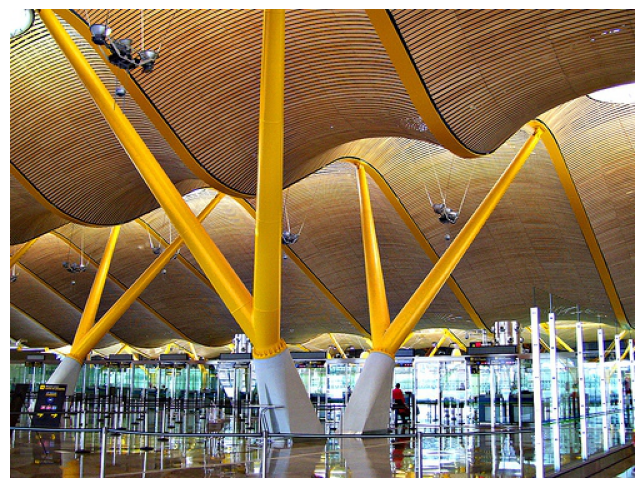

width: 475 height: 360


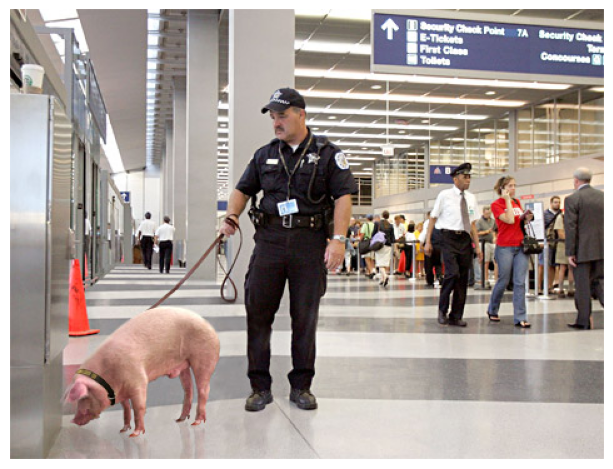

width: 500 height: 332


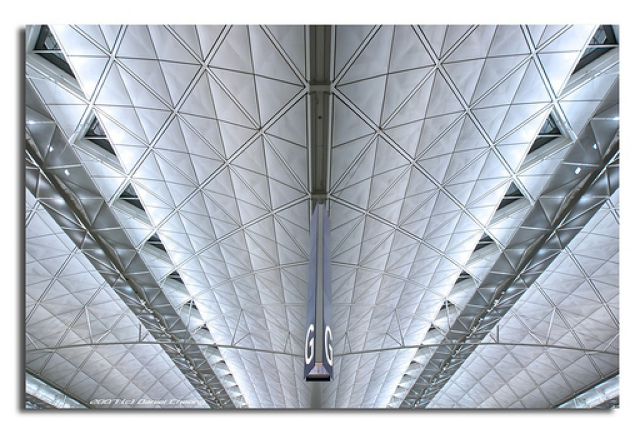

width: 500 height: 321


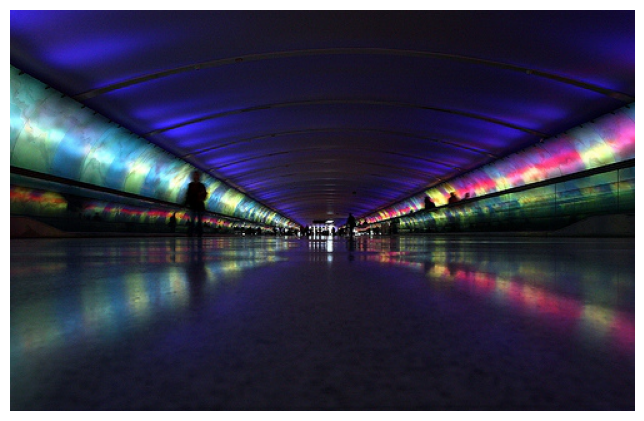

width: 500 height: 500


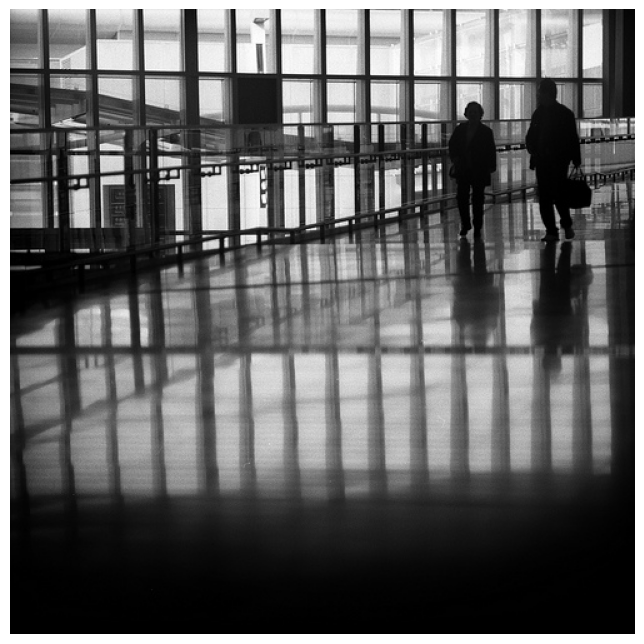

width: 500 height: 371


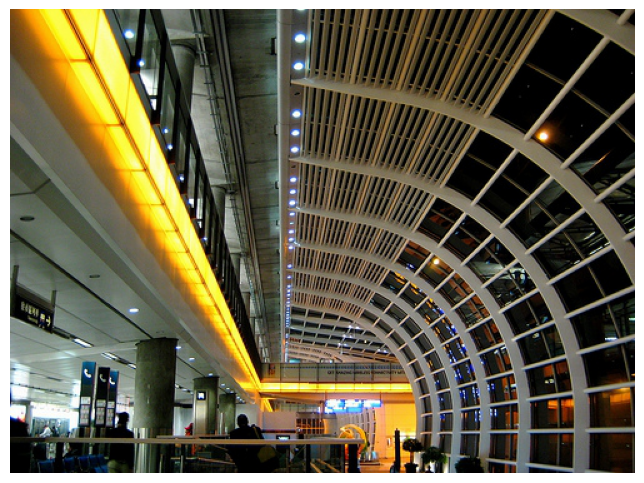

width: 500 height: 375


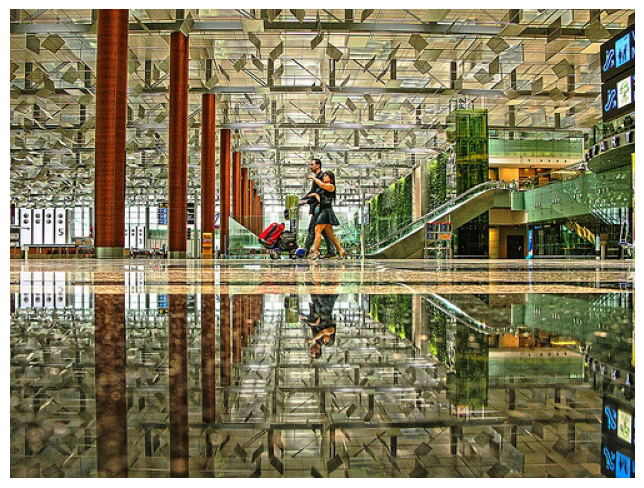

width: 500 height: 375


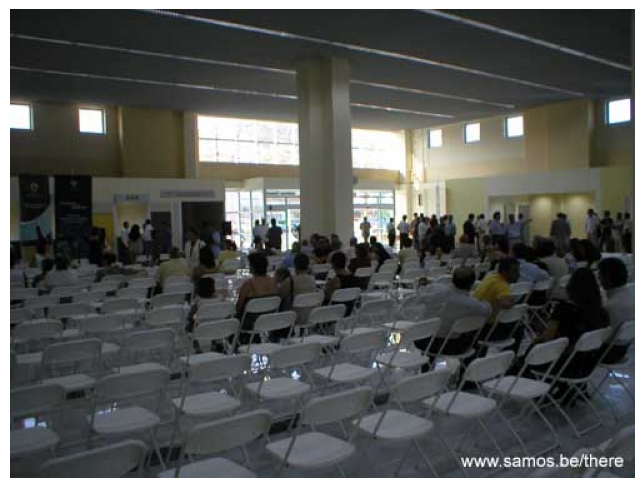

width: 500 height: 335


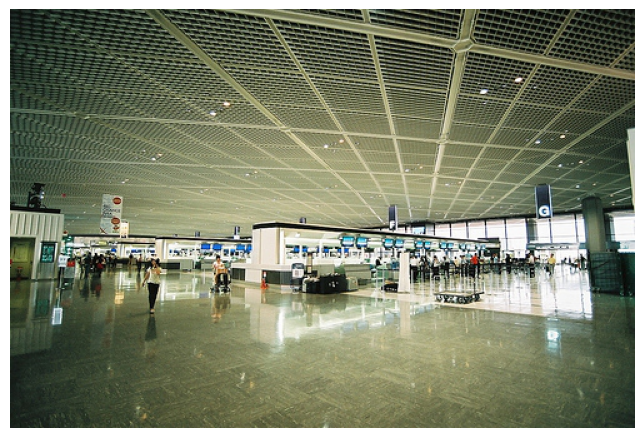

width: 400 height: 300


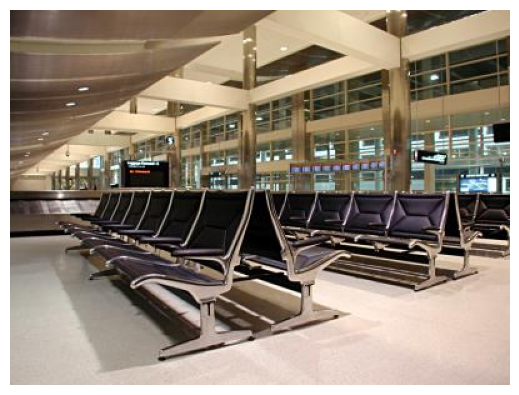

In [ ]:
# display_image_in_actual_size("./Images/airport_inside_100.jpg")
li = list(range(1, len(trainset.data_frame)))
random.shuffle(li)
for i in range(0,10):
  img_path = f'./Images/{trainset.data_frame["Id"][i]}'
  display_image_in_actual_size(img_path)

In [ ]:
# trainset = ImageDataset(csv_file = 'Train.csv', root_dir = './Images', transform=transform_augmented)
# valset   = ImageDataset(csv_file = 'Train.csv', root_dir = './Images', transform=transform_raw)
# accset   = ImageDataset(csv_file = 'Train.csv', root_dir = './Images', transform=transform_raw)

Helper Function to split dataset into train and validation set

In [ ]:
def train_valid_split(dataset, test_size = 0.25, shuffle = False, random_seed = 0):
    length = dataset.__len__()
    indices = list(range(1,length))
    
    if shuffle == True:
        random.seed(random_seed)
        random.shuffle(indices)
    
    if type(test_size) is float:
        split = floor(test_size * length)
    elif type(test_size) is int:
        split = test_size
    else:
        raise ValueError('%s should be an int or a float' % str)
    return indices[split:], indices[:split]

In [ ]:
class SubsetSampler(Sampler):
     
    def __init__(self, indices):
        self.num_samples = len(indices)
        self.indices = indices

    def __iter__(self):
        return iter(self.indices)
    
    def __len__(self):
        return self.num_samples

In [ ]:
def dataset_info(dataset):
    dataset_size=len(dataset)
    classes = dataset.Category.unique()
    num_classes = len(classes)
    
    #Initialize list
    count = {}     
    for i in range(num_classes):
        count[classes[i]] = 0
        
    #Count every label
    for i in range(dataset_size):
        count[dataset.Category.values[i]]+=1
        
    print('Size of the dataset:' + str(dataset_size))
    print('Number of classes:' + str(num_classes))    
    print('Samples for every class:')
    
    #Print the count
    for i in range(num_classes):
        print(classes[i] + " : " + str(count[classes[i]]))
    

Create Tarining and validation dataset

In [ ]:
train_idx, valid_idx = train_valid_split(trainset, 0.25)

Summarize Train dataset content

In [ ]:
train_dataset = trainset.data_frame.loc[trainset.data_frame.index[train_idx]]
dataset_info(train_dataset)

NameError: ignored

Summarize Test (validation) dataset content

In [ ]:
test_dataset = trainset.data_frame.loc[trainset.data_frame.index[valid_idx]]
dataset_info(test_dataset)

Spliting the Images folder using  split-folders package
https://pypi.org/project/split-folders/

In [ ]:
!pip install split-folders

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
# !rm -r output

In [ ]:
!ls

Images	indoorCVPR_09.tar  sample_data	Source_Images  Train.csv


In [ ]:
import splitfolders

# Split with a ratio.
# To only split into training and validation set, set a tuple to `ratio`, i.e, `(.8, .2)`.
splitfolders.ratio("Source_Images/Images", output="output",
    seed=1337, ratio=(.8, .1, .1), group_prefix=None, move=True) # default values


Copying files: 15620 files [00:00, 19765.14 files/s]


In [ ]:
!ls

Images	indoorCVPR_09.tar  output  sample_data	Source_Images  Train.csv


In [ ]:
train_ds = ImageFolder('output/train',transform_augmented)
val_ds = ImageFolder('output/val',transform_raw)
test_ds = ImageFolder('output/test',transform_raw)

In [ ]:
len(train_ds)

12467

In [ ]:
len(val_ds)

1532

In [ ]:
len(test_ds)

1621

In [ ]:
train_ds.classes

['airport_inside',
 'artstudio',
 'auditorium',
 'bakery',
 'bar',
 'bathroom',
 'bedroom',
 'bookstore',
 'bowling',
 'buffet',
 'casino',
 'children_room',
 'church_inside',
 'classroom',
 'cloister',
 'closet',
 'clothingstore',
 'computerroom',
 'concert_hall',
 'corridor',
 'deli',
 'dentaloffice',
 'dining_room',
 'elevator',
 'fastfood_restaurant',
 'florist',
 'gameroom',
 'garage',
 'greenhouse',
 'grocerystore',
 'gym',
 'hairsalon',
 'hospitalroom',
 'inside_bus',
 'inside_subway',
 'jewelleryshop',
 'kindergarden',
 'kitchen',
 'laboratorywet',
 'laundromat',
 'library',
 'livingroom',
 'lobby',
 'locker_room',
 'mall',
 'meeting_room',
 'movietheater',
 'museum',
 'nursery',
 'office',
 'operating_room',
 'pantry',
 'poolinside',
 'prisoncell',
 'restaurant',
 'restaurant_kitchen',
 'shoeshop',
 'stairscase',
 'studiomusic',
 'subway',
 'toystore',
 'trainstation',
 'tv_studio',
 'videostore',
 'waitingroom',
 'warehouse',
 'winecellar']

In [ ]:
def ds_info(dataset):
    dataset_size=len(dataset)
    classes = dataset.classes
    num_classes = len(classes)
    
    #Initialize list
    count = []     
    for x in range(num_classes):
        count.append(0)
        
    #Count every label
    for x in range(dataset_size):
        count[dataset[x][1]]+=1
    
    print('Size of the dataset:' + str(dataset_size))
    print('Number of classes:' + str(num_classes))    
    print('Samples for every class:')
    
    #Print the count
    for x in range(num_classes):
        print(classes[x] + " : " + str(count[x]))

In [ ]:
def get_default_device():
    """Pick GPU if available, else CPU"""
    if torch.cuda.is_available():
        return torch.device('cuda')
    else:
        return torch.device('cpu')
    
def to_device(data, device):
    """Move tensor(s) to chosen device"""
    if isinstance(data, (list,tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

class DeviceDataLoader():
    """Wrap a dataloader to move data to a device"""
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device
        
    def __iter__(self):
        """Yield a batch of data after moving it to device"""
        for b in self.dl: 
            yield to_device(b, self.device)

    def __len__(self):
        """Number of batches"""
        return len(self.dl)

Training dataset information:

In [ ]:
ds_info(train_ds)

Validation dataset information:

In [ ]:
ds_info(val_ds)

Test dataset information:

In [ ]:
ds_info(test_ds)

Visualizing some sample data obtain one batch of training images

In [ ]:
from torchvision.utils import make_grid

In [ ]:
val_ds.imgs[0]

In [ ]:
display_image_in_actual_size("output/val/airport_inside/airport_inside_0044.jpg")

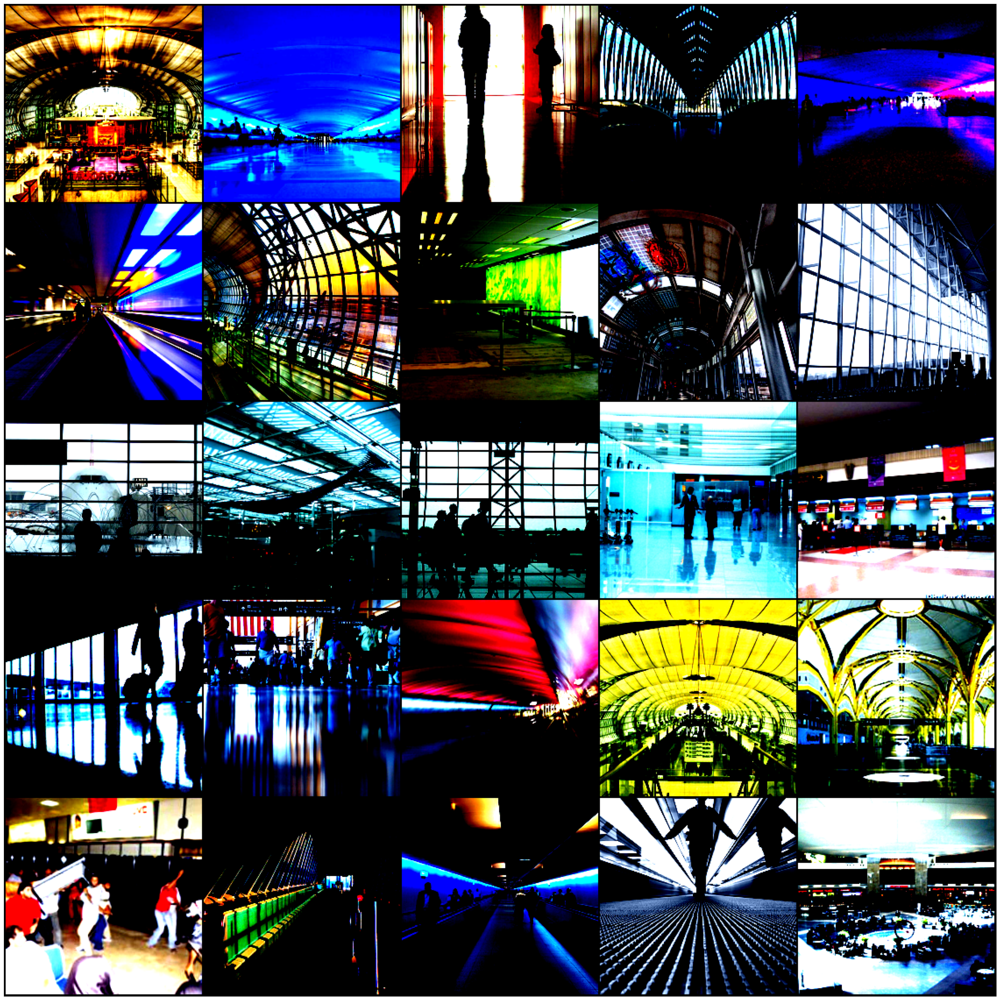

In [ ]:
#train_sampler = SubsetRandomSampler(train_idx)
#train_loader = DataLoader(trainset,batch_size=50,sampler=train_sampler,num_workers=0)
val_dl = DataLoader(val_ds, batch_size=50, num_workers=0, shuffle=False, pin_memory=True)
images, labels = next(iter(val_dl))
#images = images.numpy() # convert images to numpy for display

# plot the images in the batch, along with the corresponding labels
# fig = plt.figure(figsize=(100, 16))
# for idx in np.arange(16):                                             #Change the range according to your batch-size
    # ax = fig.add_subplot(2, int(20/2), idx+1, xticks=[], yticks=[])
    # img = images[idx]
    # # plt.imshow(np.transpose(img, (1, 2, 0)))
    # plt.imshow(np.transpose(img.astype('uint8'), (1, 2, 0)))
fig, ax = plt.subplots(figsize=(50, 33))
ax.set_xticks([]); ax.set_yticks([])
ax.imshow(make_grid(images[:25], nrow=5).permute(1, 2, 0))

Sampler Based on 2nd Approach of splitting the dataset

In [ ]:
torch.manual_seed(1337)
torch.cuda.manual_seed(1337)
np.random.seed(1337)
random.seed(1337)
cudnn.deterministic = True

In [ ]:
batch_size = 100

train_dl = DataLoader(train_ds, batch_size=batch_size, num_workers=0, shuffle=True, pin_memory=True)
val_dl = DataLoader(val_ds, batch_size=batch_size, num_workers=0, shuffle=False, pin_memory=True)
test_dl = DataLoader(test_ds, batch_size=batch_size, num_workers=0, shuffle=False, pin_memory=True)

In [ ]:
images, labels = next(iter(val_dl))
images.shape

torch.Size([100, 3, 300, 300])

 Transfering train data to device

In [ ]:
device = get_default_device() #Getting the device
print(device)

train_dl = DeviceDataLoader(train_dl, device)
val_dl = DeviceDataLoader(val_dl, device)
test_dl = DeviceDataLoader(test_dl, device)

cuda


### Model 1: resnext101_32x16d_wsl

Sampler Based on 1st Approach of splitting the dataset

In [ ]:
# train_sampler = SubsetRandomSampler(train_idx)
# valid_sampler = SubsetSampler(valid_idx)
# train_loader = DataLoader(trainset,batch_size=50,sampler=train_sampler,num_workers=0)    
# valid_loader = DataLoader(valset,batch_size=50,sampler=valid_sampler,num_workers=0)
# acc_loader   = DataLoader(accset,batch_size=50,num_workers=0)

Getting the model architecture of the Resnext101_32x16d and the pre-trained weights on ImageNet

In [ ]:
resnext_model = torch.hub.load('facebookresearch/WSL-Images', 'resnext101_32x16d_wsl')

Downloading: "https://github.com/facebookresearch/WSL-Images/zipball/main" to /root/.cache/torch/hub/main.zip
Downloading: "https://download.pytorch.org/models/ig_resnext101_32x16-c6f796b0.pth" to /root/.cache/torch/hub/checkpoints/ig_resnext101_32x16-c6f796b0.pth
100%|██████████| 741M/741M [00:44<00:00, 17.6MB/s]


Copying some layers so that they can be re-assigned after freezing the model

In [ ]:
avgpool = resnext_model.avgpool
l4 = resnext_model.layer4
l3 = resnext_model.layer3

Freezing the model

In [ ]:
for param in resnext_model.parameters():
    param.requires_grad = False

for param in resnext_model.fc.parameters():
    param.requires_grad = True

Customising the last FC layer as per our needs and assigning previously copied layers so that they are un-frozen

In [ ]:
resnext_model.fc = nn.Sequential(nn.Dropout(p=0.5),nn.Linear(2048, 1024),nn.LeakyReLU(inplace=True),nn.Linear(1024,67),nn.Softmax(dim=1))
# resnext_model.layer4 = l4
# resnext_model.layer3 = l3
# resnext_model.avgpool = avgpool

In [ ]:
torch.cuda.empty_cache()

Defining and sending the model to GPU

In [ ]:
# device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
resnext_model.to(device)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
      (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1

Checking Model Summary

In [ ]:
from torchsummary import summary
summary(resnext_model,input_size=(3,300,300))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 150, 150]           9,408
       BatchNorm2d-2         [-1, 64, 150, 150]             128
              ReLU-3         [-1, 64, 150, 150]               0
         MaxPool2d-4           [-1, 64, 75, 75]               0
            Conv2d-5          [-1, 512, 75, 75]          32,768
       BatchNorm2d-6          [-1, 512, 75, 75]           1,024
              ReLU-7          [-1, 512, 75, 75]               0
            Conv2d-8          [-1, 512, 75, 75]          73,728
       BatchNorm2d-9          [-1, 512, 75, 75]           1,024
             ReLU-10          [-1, 512, 75, 75]               0
           Conv2d-11          [-1, 256, 75, 75]         131,072
      BatchNorm2d-12          [-1, 256, 75, 75]             512
           Conv2d-13          [-1, 256, 75, 75]          16,384
      BatchNorm2d-14          [-1, 256,

Defining the Loss function and optimizer

In [ ]:
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(resnext_model.parameters(), lr=0.1, momentum=0.9, weight_decay=5e-4)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=200)

Initialising best_acc and best_Acc weights

In [ ]:
best_acc=0.0
best_model_wts = copy.deepcopy(resnext_model.state_dict())

In [ ]:
torch.cuda.empty_cache()

In [ ]:
if device == 'cuda':
    resnext_model = torch.nn.DataParallel(resnext_model)
    cudnn.benchmark = True
    torch.cuda.set_device(device)
    model = resnext_model.cuda(device)
else:
  model = torch.nn.DataParallel(resnext_model).cuda()

Start the training the model and find the best fitting model by running multiple epoches 

In [ ]:
num_epochs=20
for epoch in range(num_epochs):
    print("Epoch  : "+str(epoch))
    torch.cuda.empty_cache()
    print("-"*10)
    
    #training loop
    running_loss = 0.0
    resnext_model.train()
    for inp,labels in train_dl:
        # print(inp.shape)
        inp=inp.to(device)
        labels=labels.to(device)
        optimizer.zero_grad()
        with torch.set_grad_enabled(True):
            outputs = resnext_model(inp)            
            loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item()       
    epoch_loss = running_loss / (len(train_dl)*1.0)
    print('TRAINING SET   Loss: {}'.format(epoch_loss))
    
    # validation loop
    if True:
        correct=0
        wrong=0
        resnext_model.eval()
        for inp,labels in val_dl:
            inp=inp.to(device)
            labels=labels.to(device)
            optimizer.zero_grad()
            with torch.no_grad():
                outputs = resnext_model(inp)
            _, preds = torch.max(outputs.data, 1)
            correct += torch.sum(preds == labels)
            wrong += torch.sum(preds != labels)
                
        acc = (correct.float()) / ((correct+wrong).float())
        print('VALIDATION SET Correct: {} Wrong {} Acc {}'.format(correct,wrong,acc))
        if acc > best_acc:
            best_acc = acc
            best_model_wts = copy.deepcopy(resnext_model.state_dict())      
        
            
    running_loss = 0.0
    scheduler.step()

resnext_model.load_state_dict(best_model_wts)


Epoch  : 0
----------
TRAINING SET   Loss: 2.594803714752197
VALIDATION SET Correct: 1090 Wrong 442 Acc 0.7114882469177246
Epoch  : 1
----------
TRAINING SET   Loss: 2.53399196434021
VALIDATION SET Correct: 1181 Wrong 351 Acc 0.7708877325057983
Epoch  : 2
----------
TRAINING SET   Loss: 2.2993356113433836
VALIDATION SET Correct: 1145 Wrong 387 Acc 0.747389018535614
Epoch  : 3
----------
TRAINING SET   Loss: 2.142768401145935
VALIDATION SET Correct: 1232 Wrong 300 Acc 0.8041775226593018
Epoch  : 4
----------
TRAINING SET   Loss: 2.210546983718872
VALIDATION SET Correct: 1139 Wrong 393 Acc 0.7434725761413574
Epoch  : 5
----------
TRAINING SET   Loss: 1.8735702877044678
VALIDATION SET Correct: 1220 Wrong 312 Acc 0.7963446378707886
Epoch  : 6
----------
TRAINING SET   Loss: 1.9551253819465637
VALIDATION SET Correct: 1185 Wrong 347 Acc 0.7734987139701843
Epoch  : 7
----------
TRAINING SET   Loss: 1.9911530265808106
VALIDATION SET Correct: 1187 Wrong 345 Acc 0.7748041749000549
Epoch  : 8
---

Checking Accuracy on Test DataSet

In [ ]:
if True: 
        correct=0
        wrong=0
        for inp,labels in test_dl:
            resnext_model.eval()
            inp=inp.to(device)
            labels=labels.to(device)
            optimizer.zero_grad()
            with torch.no_grad():
                outputs = resnext_model(inp)
            _, preds = torch.max(outputs.data, 1)
            correct += torch.sum(preds == labels)
            wrong += torch.sum(preds != labels)
              
        acc = (correct.float()) / ((correct+wrong).float())
        print('ACCURACY SET   Correct: {} Wrong {} ACC {} '.format(correct,wrong,acc))

Save the best model found from above training

In [ ]:
torch.save(resnext_model.state_dict(), "best_resnext_image_recognization_model.pkl")

### Common utility functions for all next Models

We create an accuracy function that counts the amount of correct predictions and divides it with the size of the batch. It gives us a metric of how good the network it's getting.

In [ ]:
def accuracy(outputs, labels):
    _, preds = torch.max(outputs, dim=1)
    return torch.tensor(torch.sum(preds == labels).item() / len(preds))

We create a base class with some helper functions that are going to allow us to test different architectures easier and make comparison clearer.

**training_step:** used to pass training batch trough the network and calculate the loss.

**validation step:** similar to training but used for test data, the only difference is that this one also calculates the accuracy and returns both results.

**validation_epoch_end:** once a whole validation data passes through, this function is going to get the mean loss and accuracy.

**epoch_end:** this one help us keep track of performance during training showing loss and accuracy on every epoch.

In [ ]:
class ImageClassificationBase(nn.Module):
    def training_step(self, batch):
        images, labels = batch 
        out = self(images)                  # Generate predictions
        loss = F.cross_entropy(out, labels) # Calculate loss
        return loss
    
    def validation_step(self, batch):
        images, labels = batch 
        out = self(images)                    # Generate predictions
        loss = F.cross_entropy(out, labels)   # Calculate loss
        acc = accuracy(out, labels)           # Calculate accuracy
        return {'val_loss': loss.detach(), 'val_acc': acc}
        
    def validation_epoch_end(self, outputs):
        batch_losses = [x['val_loss'] for x in outputs]
        epoch_loss = torch.stack(batch_losses).mean()   # Combine losses
        batch_accs = [x['val_acc'] for x in outputs]
        epoch_acc = torch.stack(batch_accs).mean()      # Combine accuracies
        return {'val_loss': epoch_loss.item(), 'val_acc': epoch_acc.item()}
    
    def epoch_end(self, epoch, result):
        print("Epoch [{}], last_lr: {:.5f}, train_loss: {:.4f}, val_loss: {:.4f}, val_acc: {:.4f}".format(
            (epoch+1), result['lrs'][-1], result['train_loss'], result['val_loss'], result['val_acc']))

In [ ]:
class init_model(ImageClassificationBase):
    def __init__(self, model, num_classes):
        super().__init__()
        # Use a pretrained model
        # self.network = models.resnet34(pretrained=True)
        self.network = model
        # Replace last layer
        if hasattr(self.network, 'fc'):
          num_ftrs = self.network.fc.in_features
          self.network.fc = nn.Linear(num_ftrs, num_classes)
    
    def forward(self, xb):
        return torch.sigmoid(self.network(xb))
    
    def freeze(self):
        # To freeze the residual layers
        for param in self.network.parameters():
            param.require_grad = False
        if hasattr(self.network, 'fc'):
          for param in self.network.fc.parameters():
              param.require_grad = True
    
    def unfreeze(self):
        # Unfreeze all layers
        for param in self.network.parameters():
            param.require_grad = True

Now we create some functions to automatize and simplify training independent of the network.

**evaluate:** run the validation step (defines and explained before) for each batch, this gets us the loss and accuracy for the test dataset.

**get_lr:** get the current learning rate, the utility of this function will be clear in a moment.

**fit_one_cycle:** the training function. Its parameters are:

> *epochs:* number of epochs to train for.

> *Maximum learning rate:* we're going to use a one cycle learning rate scheduler, which will update the learning rate for each epoch.

> *Model:* the network to be trained.

> *Train Loader:* Training dataset.

> *Val Loader:* Test dataset.

> *Weight decay:* a weight decay can be configured.

> *Grad clip:* if gradient clipping it's desired it can be set.

> *opt_func:* desired optimization function.

In [ ]:
@torch.no_grad()
def evaluate(model, val_loader):
    model.eval()
    outputs = [model.validation_step(batch) for batch in val_loader]
    return model.validation_epoch_end(outputs)

def get_lr(optimizer):
    for param_group in optimizer.param_groups:
        return param_group['lr']

def fit_one_cycle(epochs, max_lr, model, train_loader, val_loader, 
                  weight_decay=0, grad_clip=None, opt_func=torch.optim.SGD):
    torch.cuda.empty_cache()
    history = []
    
    # Set up cutom optimizer with weight decay
    optimizer = opt_func(model.parameters(), max_lr, weight_decay=weight_decay)
    # Set up one-cycle learning rate scheduler
    sched = torch.optim.lr_scheduler.OneCycleLR(optimizer, max_lr, epochs=epochs, 
                                                steps_per_epoch=len(train_loader))

    # sched = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=200)
    
    for epoch in range(epochs):
        torch.cuda.empty_cache()
        # Training Phase
        model.train()
        train_losses = []
        lrs = []
        for batch in tqdm(train_loader):
            loss = model.training_step(batch)
            train_losses.append(loss)
            loss.backward()
            
            # Gradient clipping
            if grad_clip: 
                nn.utils.clip_grad_value_(model.parameters(), grad_clip)
            
            optimizer.step()
            optimizer.zero_grad()
            
            # Record & update learning rate
            lrs.append(get_lr(optimizer))
        
        # Validation phase
        result = evaluate(model, val_loader)
        result['train_loss'] = torch.stack(train_losses).mean().item()
        result['lrs'] = lrs
        model.epoch_end(epoch, result)
        history.append(result)
        sched.step()
    return history

Function to help visualize accuracy for each epoch.

In [ ]:
def plot_scores(history):
    scores = [x['val_acc'] for x in history]
    plt.plot(scores, '-x')
    plt.xlabel('epoch')
    plt.ylabel('Accuracy')
    plt.title('Accuracy vs. No. of epochs');

Function to help visualize training and validation loss for each epoch.

In [ ]:
def plot_losses(history):
    train_losses = [x.get('train_loss') for x in history]
    val_losses = [x['val_loss'] for x in history]
    plt.plot(train_losses, '-bx')
    plt.plot(val_losses, '-rx')
    plt.xlabel('epoch')
    plt.ylabel('loss')
    plt.legend(['Training', 'Validation'])
    plt.title('Loss vs. No. of epochs');

predict image by running an image through the network and get a prediction.

In [ ]:
def show_sample(img, target):
    plt.imshow(img.permute(1, 2, 0))
    print('Labels:', target)
    
def predict_image(img, model):
    # Convert to a batch of 1
    xb = to_device(img.unsqueeze(0), device)
    # Get predictions from model
    yb = model(xb)
    # Pick index with highest probability
    _, preds  = torch.max(yb, dim=1)
    # Retrieve the class label
    show_sample(img,test_ds.classes[preds[0].item()])

### 1. Resnet34 Model

In [ ]:
torch.cuda.empty_cache()
resnet34 = models.resnet34(pretrained=True)
num_classes = len(train_ds.classes)
resnet_model = to_device(init_model(resnet34, num_classes), device)
resnet_model

init_model(
  (network): ResNet(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_

In [ ]:
if device == 'cuda':
    # resnet_model = torch.nn.DataParallel(resnet_model)
    cudnn.benchmark = True
    torch.cuda.set_device(device)
    resnet_model = resnet_model.cuda(device)

In [ ]:
model_eval = [evaluate(resnet_model, test_dl)]
model_eval

[{'val_loss': 4.2051615715026855, 'val_acc': 0.02647058665752411}]

After applying Hyperparameters

In [ ]:
# Best Hyperparameter
epochs = 5
max_lr2 = 0.001
grad_clip = 0.1
weight_decay = 5e-5
opt_func = torch.optim.Adam

# Try 1
# epochs = 5
# max_lr2 = 0.001
# grad_clip = 0.1
# weight_decay = 5e-3
# opt_func = torch.optim.Adam

# Try 2
# epochs = 5
# max_lr2 = 0.0004
# grad_clip = 0.1
# weight_decay = 5e-4
# opt_func = torch.optim.Adam

# Try 3
# epochs = 5
# max_lr2 = 0.1
# grad_clip = 0.1
# weight_decay = 5e-5
# opt_func = torch.optim.Adam


# Try 4 -- GOOD
# epochs = 5
# max_lr2 = 0.001
# grad_clip = 1.0
# weight_decay = 5e-5
# opt_func = torch.optim.Adam


# Try 5
epochs = 10
max_lr2 = 0.001
grad_clip = 2.0
weight_decay = 5e-5
opt_func = torch.optim.Adam

# tried no good
# epochs = 10
# max_lr2 = 0.00001
# grad_clip = 2.0
# weight_decay = 5e-5
# opt_func = torch.optim.Adam

# tried no good
# epochs = 10
# max_lr2 = 0.00001
# grad_clip = 2.0
# weight_decay = 5e-5
# opt_func = torch.optim.Adam

# tried worst accuracy among the other
# epochs = 5
# max_lr2 = 0.0001
# grad_clip = 0.1
# weight_decay = 5e-5
# opt_func = torch.optim.SGD

Freeze the model and retrain with above hyperparameter

In [ ]:
%%time
# Training only the last layer
resnet_model.freeze()
model_eval += fit_one_cycle(epochs, max_lr2, resnet_model, train_dl, test_dl, 
                         grad_clip=grad_clip, 
                         weight_decay=weight_decay 
                        , opt_func=opt_func
                         )

  0%|          | 0/125 [00:00<?, ?it/s]

Epoch [1], last_lr: 0.00004, train_loss: 3.9275, val_loss: 3.7177, val_acc: 0.4664


  0%|          | 0/125 [00:00<?, ?it/s]

Epoch [2], last_lr: 0.00004, train_loss: 3.6745, val_loss: 3.5645, val_acc: 0.5719


  0%|          | 0/125 [00:00<?, ?it/s]

Epoch [3], last_lr: 0.00004, train_loss: 3.5716, val_loss: 3.4913, val_acc: 0.6419


  0%|          | 0/125 [00:00<?, ?it/s]

Epoch [4], last_lr: 0.00004, train_loss: 3.5130, val_loss: 3.4518, val_acc: 0.6706


  0%|          | 0/125 [00:00<?, ?it/s]

Epoch [5], last_lr: 0.00004, train_loss: 3.4741, val_loss: 3.4233, val_acc: 0.7004


  0%|          | 0/125 [00:00<?, ?it/s]

Epoch [6], last_lr: 0.00004, train_loss: 3.4478, val_loss: 3.4081, val_acc: 0.7039


  0%|          | 0/125 [00:00<?, ?it/s]

Epoch [7], last_lr: 0.00004, train_loss: 3.4257, val_loss: 3.3937, val_acc: 0.7235


  0%|          | 0/125 [00:00<?, ?it/s]

Epoch [8], last_lr: 0.00004, train_loss: 3.4125, val_loss: 3.3816, val_acc: 0.7345


  0%|          | 0/125 [00:00<?, ?it/s]

Epoch [9], last_lr: 0.00004, train_loss: 3.4008, val_loss: 3.3739, val_acc: 0.7345


  0%|          | 0/125 [00:00<?, ?it/s]

Epoch [10], last_lr: 0.00004, train_loss: 3.3866, val_loss: 3.3701, val_acc: 0.7420
CPU times: user 34min 49s, sys: 2min 3s, total: 36min 52s
Wall time: 38min 7s


Train the whole Network:

In [ ]:
resnet_model.unfreeze()
model_eval += fit_one_cycle(epochs, max_lr2, resnet_model, train_dl, test_dl, 
                         grad_clip=grad_clip, 
                         weight_decay=weight_decay, 
                         opt_func=opt_func)

  0%|          | 0/125 [00:00<?, ?it/s]

Epoch [1], last_lr: 0.00004, train_loss: 3.3775, val_loss: 3.3617, val_acc: 0.7528


  0%|          | 0/125 [00:00<?, ?it/s]

Epoch [2], last_lr: 0.00004, train_loss: 3.3646, val_loss: 3.3593, val_acc: 0.7645


  0%|          | 0/125 [00:00<?, ?it/s]

Epoch [3], last_lr: 0.00004, train_loss: 3.3567, val_loss: 3.3544, val_acc: 0.7715


  0%|          | 0/125 [00:00<?, ?it/s]

Epoch [4], last_lr: 0.00004, train_loss: 3.3519, val_loss: 3.3542, val_acc: 0.7620


  0%|          | 0/125 [00:00<?, ?it/s]

Epoch [5], last_lr: 0.00004, train_loss: 3.3453, val_loss: 3.3508, val_acc: 0.7615


  0%|          | 0/125 [00:00<?, ?it/s]

Epoch [6], last_lr: 0.00004, train_loss: 3.3425, val_loss: 3.3455, val_acc: 0.7756


  0%|          | 0/125 [00:00<?, ?it/s]

Epoch [7], last_lr: 0.00004, train_loss: 3.3350, val_loss: 3.3466, val_acc: 0.7709


  0%|          | 0/125 [00:00<?, ?it/s]

Epoch [8], last_lr: 0.00004, train_loss: 3.3339, val_loss: 3.3519, val_acc: 0.7691


  0%|          | 0/125 [00:00<?, ?it/s]

Epoch [9], last_lr: 0.00004, train_loss: 3.3327, val_loss: 3.3424, val_acc: 0.7809


  0%|          | 0/125 [00:00<?, ?it/s]

Epoch [10], last_lr: 0.00004, train_loss: 3.3255, val_loss: 3.3474, val_acc: 0.7691


Plot Scores and losses

Resnet 34 Accuracy scores over each epoch plot


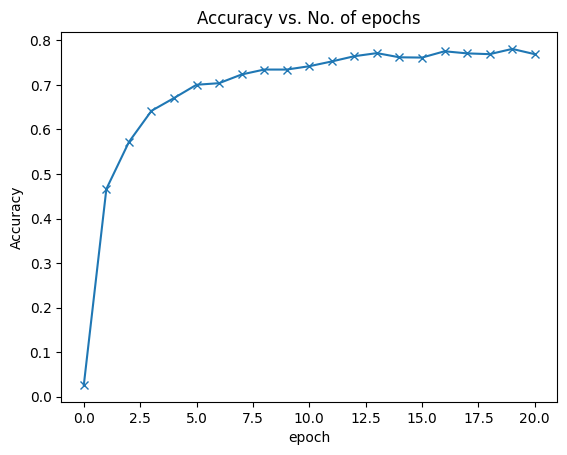

In [ ]:
print("Resnet 34 Accuracy scores over each epoch plot")
plot_scores(model_eval)

Resnet 34 Accuracy scores over each epoch plot

Resnet 34 Losses over each epoch plot


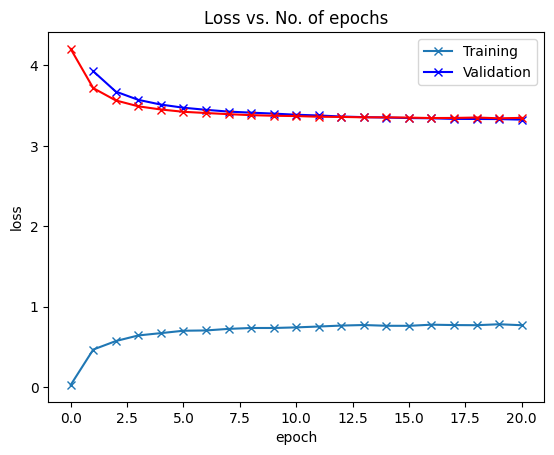

In [ ]:
print("\nResnet 34 Losses over each epoch plot")
plot_losses(model_eval)

1.  model = VGG('VGG19')
2.  model = resnet34()
3.  model = PreActResNet18()
4.  model = GoogLeNet()
5.  model = DenseNet121()
6.  model = ResNeXt29_2x64d()
7.  model = MobileNet()
8.  model = MobileNetV2()
9.  model = DPN92()
10. model = ShuffleNetG2()
11. model = SENet18()
12. model = ShuffleNetV2(1)
13. model = EfficientNetB0()
14. model = RegNetX_200MF()
15. model = SimpleDLA()

### 2. VGG16 Model 

In [ ]:
torch.cuda.empty_cache()
vgg_model = models.vgg16(pretrained=True)
num_classes = len(train_ds.classes)
vgg_model = to_device(init_model(vgg_model, num_classes), device)
vgg_model

init_model(
  (network): VGG(
    (features): Sequential(
      (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): ReLU(inplace=True)
      (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (3): ReLU(inplace=True)
      (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (6): ReLU(inplace=True)
      (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (8): ReLU(inplace=True)
      (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (11): ReLU(inplace=True)
      (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (13): ReLU(inplace=True)
      (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (15): ReLU(inplace=True)
      (

In [ ]:
if device == 'cuda':
    cudnn.benchmark = True
    torch.cuda.set_device(device)
    vgg_model = vgg_model.cuda(device)

model_eval = [evaluate(vgg_model, test_dl)]
model_eval

[{'val_loss': 7.244908332824707, 'val_acc': 0.0}]

After applying Hyperparameters

In [ ]:
# Best Hyperparameter
epochs = 10
max_lr2 = 0.001
grad_clip = 2.0
weight_decay = 5e-5
opt_func = torch.optim.Adam

torch.cuda.empty_cache()

In [ ]:
%%time
# Training only the last layer
vgg_model.freeze()
model_eval += fit_one_cycle(epochs, max_lr2, vgg_model, train_dl, test_dl, 
                         grad_clip=grad_clip, 
                         weight_decay=weight_decay 
                        , opt_func=opt_func
                         )

  0%|          | 0/125 [00:00<?, ?it/s]

OutOfMemoryError: ignored

In [ ]:
vgg_model.unfreeze()
model_eval += fit_one_cycle(epochs, max_lr2, vgg_model, train_dl, test_dl, 
                         grad_clip=grad_clip, 
                         weight_decay=weight_decay, 
                         opt_func=opt_func)

In [ ]:
print("VGG 19 Accuracy scores over each epoch plot")
plot_scores(model_eval)

print("\nVGG 19 Losses over each epoch plot")
plot_losses(model_eval)

### 3. Squeezenet Model

In [ ]:
torch.cuda.empty_cache()
squeezenet_model = models.squeezenet1_0(pretrained=True)
num_classes = len(train_ds.classes)
squeezenet_model = to_device(init_model(squeezenet_model, num_classes), device)
squeezenet_model

init_model(
  (network): SqueezeNet(
    (features): Sequential(
      (0): Conv2d(3, 96, kernel_size=(7, 7), stride=(2, 2))
      (1): ReLU(inplace=True)
      (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=True)
      (3): Fire(
        (squeeze): Conv2d(96, 16, kernel_size=(1, 1), stride=(1, 1))
        (squeeze_activation): ReLU(inplace=True)
        (expand1x1): Conv2d(16, 64, kernel_size=(1, 1), stride=(1, 1))
        (expand1x1_activation): ReLU(inplace=True)
        (expand3x3): Conv2d(16, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (expand3x3_activation): ReLU(inplace=True)
      )
      (4): Fire(
        (squeeze): Conv2d(128, 16, kernel_size=(1, 1), stride=(1, 1))
        (squeeze_activation): ReLU(inplace=True)
        (expand1x1): Conv2d(16, 64, kernel_size=(1, 1), stride=(1, 1))
        (expand1x1_activation): ReLU(inplace=True)
        (expand3x3): Conv2d(16, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (exp

In [ ]:
if device == 'cuda':
    cudnn.benchmark = True
    torch.cuda.set_device(device)
    squeezenet_model = squeezenet_model.cuda(device)

model_eval = [evaluate(squeezenet_model, test_dl)]
model_eval

[{'val_loss': 6.930938243865967, 'val_acc': 0.0}]

In [ ]:
%%time
# Training only the last layer
squeezenet_model.freeze()
model_eval += fit_one_cycle(epochs, max_lr2, squeezenet_model, train_dl, test_dl, 
                         grad_clip=grad_clip, 
                         weight_decay=weight_decay 
                        , opt_func=opt_func
                         )

  0%|          | 0/125 [00:00<?, ?it/s]

Epoch [1], last_lr: 0.00004, train_loss: 6.7231, val_loss: 6.5449, val_acc: 0.0018


  0%|          | 0/125 [00:00<?, ?it/s]

Epoch [2], last_lr: 0.00004, train_loss: 6.5308, val_loss: 6.4839, val_acc: 0.0424


  0%|          | 0/125 [00:00<?, ?it/s]

Epoch [3], last_lr: 0.00004, train_loss: 6.4780, val_loss: 6.4530, val_acc: 0.0447


  0%|          | 0/125 [00:00<?, ?it/s]

Epoch [4], last_lr: 0.00004, train_loss: 6.4555, val_loss: 6.4506, val_acc: 0.0424


  0%|          | 0/125 [00:00<?, ?it/s]

KeyboardInterrupt: ignored

In [ ]:
squeezenet_model.unfreeze()
model_eval += fit_one_cycle(epochs, max_lr2, squeezenet_model, train_dl, test_dl, 
                         grad_clip=grad_clip, 
                         weight_decay=weight_decay, 
                         opt_func=opt_func)

In [ ]:
print("squeezenet Accuracy scores over each epoch plot")
plot_scores(model_eval)

print("\n squeezenet Losses over each epoch plot")
plot_losses(model_eval)

### 4. GoogLeNet Model